## Default of Credit Card Clients

Dataset

This dataset contains information on default payments, demographic factors, credit data, history of payment, and bill statements of credit card clients in Taiwan from April 2005 to September 2005.

Content
There are 25 variables:

ID: ID of each client

LIMIT_BAL: Amount of given credit in NT dollars (includes individual and family/supplementary credit

SEX: Gender (1=male, 2=female)

EDUCATION: (1=graduate school, 2=university, 3=high school, 4=others, 5=unknown, 6=unknown)

MARRIAGE: Marital status (1=married, 2=single, 3=others)

AGE: Age in years

PAY_0: Repayment status in September, 2005 (-1=pay duly, 1=payment delay for one month, 2=payment delay for two months, ... 8=payment delay for eight months, 9=payment delay for nine months and above)

PAY_2: Repayment status in August, 2005 (scale same as above)

PAY_3: Repayment status in July, 2005 (scale same as above)

PAY_4: Repayment status in June, 2005 (scale same as above)

PAY_5: Repayment status in May, 2005 (scale same as above)

PAY_6: Repayment status in April, 2005 (scale same as above)

BILL_AMT1: Amount of bill statement in September, 2005 (NT dollar)

BILL_AMT2: Amount of bill statement in August, 2005 (NT dollar)

BILL_AMT3: Amount of bill statement in July, 2005 (NT dollar)

BILL_AMT4: Amount of bill statement in June, 2005 (NT dollar)

BILL_AMT5: Amount of bill statement in May, 2005 (NT dollar)

BILL_AMT6: Amount of bill statement in April, 2005 (NT dollar)

PAY_AMT1: Amount of previous payment in September, 2005 (NT dollar)

PAY_AMT2: Amount of previous payment in August, 2005 (NT dollar)

PAY_AMT3: Amount of previous payment in July, 2005 (NT dollar)

PAY_AMT4: Amount of previous payment in June, 2005 (NT dollar)

PAY_AMT5: Amount of previous payment in May, 2005 (NT dollar)

PAY_AMT6: Amount of previous payment in April, 2005 (NT dollar)

default.payment.next.month: Default payment (1=yes, 0=no)

## Librerias 

In [1]:
!pip install imbalanced-learn
!pip install joblib
!pip install pydotplus
!pip install pydot
!pip install graphviz
!pip install Pillow
!pip install Image

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import itertools
from datetime import datetime 
import time
import sys
%matplotlib inline

     |████████████████████████████████| 7.9MB 9.5MB/s 
  Created wheel for Image: filename=image-1.5.33-py2.py3-none-any.whl size=19482 sha256=8a7b238dad1f74bab5d9ee53917c6c68739012c66be496d3f9925b1722a7abbe
  Stored in directory: /root/.cache/pip/wheels/87/4c/60/d5904e69c837fcdea7e03ffa0c657f35ced7e398c6f3ca17cc
Successfully built Image


## Carga Datos 

In [2]:
df0 = pd.read_excel(r'https://github.com/joatamayoav/Trabajo_Final_Analitica_Predictiva/blob/main/default_of_credit_card_clients.xls?raw=true',
     header=1,
     index_col='ID'
    )

df0.head()


,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
ID,,,,,,,,,,,,,,,,,,,,,,,,
1,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1
2,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
3,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
4,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
5,50000,1,2,1,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [3]:
df0.rename(columns=lambda x: x.lower(), inplace=True)
df0.rename(columns={"default payment next month":"default"}, inplace=True) 

df0.head()

,limit_bal,sex,education,marriage,age,pay_0,pay_2,pay_3,pay_4,pay_5,pay_6,bill_amt1,bill_amt2,bill_amt3,bill_amt4,bill_amt5,bill_amt6,pay_amt1,pay_amt2,pay_amt3,pay_amt4,pay_amt5,pay_amt6,default
ID,,,,,,,,,,,,,,,,,,,,,,,,
1,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1
2,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
3,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
4,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
5,50000,1,2,1,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [4]:
#
# Se crea copia del Dataframe original para no dañarlo
#

df = df0.copy()

df.head()

,limit_bal,sex,education,marriage,age,pay_0,pay_2,pay_3,pay_4,pay_5,pay_6,bill_amt1,bill_amt2,bill_amt3,bill_amt4,bill_amt5,bill_amt6,pay_amt1,pay_amt2,pay_amt3,pay_amt4,pay_amt5,pay_amt6,default
ID,,,,,,,,,,,,,,,,,,,,,,,,
1,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1
2,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
3,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
4,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
5,50000,1,2,1,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0


## Variables Dummys 

Variable ficticia para explicar valores cualitativos en un modelo de regresión.

In [5]:
df['grad_school'] = (df0["education"] == 1).astype(int)
df['university'] = (df0["education"] == 2).astype(int)
df['high_school'] = (df0["education"] == 3).astype(int)
df.drop("education", axis = 1, inplace = True)

df['male'] = (df0["sex"] == 1).astype(int)
df['female'] = (df0["sex"] == 2).astype(int)
df.drop("sex", axis = 1, inplace = True)

df['single'] = (df0["marriage"] == 2).astype(int)
df['married'] = (df0["marriage"] == 1).astype(int)
df.drop("marriage", axis = 1, inplace = True)

df.head(10)

,limit_bal,age,pay_0,pay_2,pay_3,pay_4,pay_5,pay_6,bill_amt1,bill_amt2,bill_amt3,bill_amt4,bill_amt5,bill_amt6,pay_amt1,pay_amt2,pay_amt3,pay_amt4,pay_amt5,pay_amt6,default,grad_school,university,high_school,male,female,single,married
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,20000,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1,0,1,0,0,1,0,1
2,120000,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1,0,1,0,0,1,1,0
3,90000,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0,0,1,0,0,1,1,0
4,50000,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0,0,1,0,0,1,0,1
5,50000,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0,0,1,0,1,0,0,1
6,50000,37,0,0,0,0,0,0,64400,57069,57608,19394,19619,20024,2500,1815,657,1000,1000,800,0,1,0,0,1,0,1,0
7,500000,29,0,0,0,0,0,0,367965,412023,445007,542653,483003,473944,55000,40000,38000,20239,13750,13770,0,1,0,0,1,0,1,0
8,100000,23,0,-1,-1,0,0,-1,11876,380,601,221,-159,567,380,601,0,581,1687,1542,0,0,1,0,0,1,1,0
9,140000,28,0,0,2,0,0,0,11285,14096,12108,12211,11793,3719,3329,0,432,1000,1000,1000,0,0,0,1,0,1,0,1


In [6]:
pay_features = ['pay_0', 'pay_2', 'pay_3', 'pay_4', 'pay_5', 'pay_6']

for p in pay_features:
    df.loc[df[p] <= 0, p] = 0

df.head()

,limit_bal,age,pay_0,pay_2,pay_3,pay_4,pay_5,pay_6,bill_amt1,bill_amt2,bill_amt3,bill_amt4,bill_amt5,bill_amt6,pay_amt1,pay_amt2,pay_amt3,pay_amt4,pay_amt5,pay_amt6,default,grad_school,university,high_school,male,female,single,married
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,20000,24,2,2,0,0,0,0,3913,3102,689,0,0,0,0,689,0,0,0,0,1,0,1,0,0,1,0,1
2,120000,26,0,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1,0,1,0,0,1,1,0
3,90000,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0,0,1,0,0,1,1,0
4,50000,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0,0,1,0,0,1,0,1
5,50000,57,0,0,0,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0,0,1,0,1,0,0,1


## Análisis Descriptivo

In [ ]:
sorted(df.columns)

['age',
 'bill_amt1',
 'bill_amt2',
 'bill_amt3',
 'bill_amt4',
 'bill_amt5',
 'bill_amt6',
 'default',
 'female',
 'grad_school',
 'high_school',
 'id',
 'limit_bal',
 'male',
 'married',
 'pay_0',
 'pay_2',
 'pay_3',
 'pay_4',
 'pay_5',
 'pay_6',
 'pay_amt1',
 'pay_amt2',
 'pay_amt3',
 'pay_amt4',
 'pay_amt5',
 'pay_amt6',
 'single',
 'university']

In [ ]:
df.dtypes

id             int64
limit_bal      int64
age            int64
pay_0          int64
pay_2          int64
pay_3          int64
pay_4          int64
pay_5          int64
pay_6          int64
bill_amt1      int64
bill_amt2      int64
bill_amt3      int64
bill_amt4      int64
bill_amt5      int64
bill_amt6      int64
pay_amt1       int64
pay_amt2       int64
pay_amt3       int64
pay_amt4       int64
pay_amt5       int64
pay_amt6       int64
default        int64
grad_school    int64
university     int64
high_school    int64
male           int64
female         int64
single         int64
married        int64
dtype: object

In [ ]:
df.shape

(30000, 29)

In [9]:
df.describe()

,limit_bal,age,pay_0,pay_2,pay_3,pay_4,pay_5,pay_6,bill_amt1,bill_amt2,bill_amt3,bill_amt4,bill_amt5,bill_amt6,pay_amt1,pay_amt2,pay_amt3,pay_amt4,pay_amt5,pay_amt6,default,grad_school,university,high_school,male,female,single,married
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.00000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000
mean,167484.322667,35.485500,0.356767,0.320033,0.304067,0.258767,0.22150,0.226567,51223.330900,49179.075167,4.701315e+04,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200,0.352833,0.467667,0.163900,0.396267,0.603733,0.532133,0.455300
std,129747.661567,9.217904,0.760594,0.801727,0.790589,0.761113,0.71772,0.715438,73635.860576,71173.768783,6.934939e+04,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062,0.477859,0.498962,0.370191,0.489129,0.489129,0.498975,0.498006
min,10000.000000,21.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,-165580.000000,-69777.000000,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,50000.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,3558.750000,2984.750000,2.666250e+03,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,140000.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,22381.500000,21200.000000,2.008850e+04,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
75%,240000.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,67091.000000,64006.250000,6.016475e+04,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000
max,1000000.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.00000,8.000000,964511.000000,983931.000000,1.664089e+06,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Análisis Exploratorio

In [8]:
# Cantidad de nulos

total = df.isnull().sum().sort_values(ascending = False)
percent = (df.isnull().sum()/df.isnull().count()*100).sort_values(ascending = False)
pd.concat([total, percent], axis=1, keys=['Total', 'Percent']).transpose()

,married,single,age,pay_0,pay_2,pay_3,pay_4,pay_5,pay_6,bill_amt1,bill_amt2,bill_amt3,bill_amt4,bill_amt5,bill_amt6,pay_amt1,pay_amt2,pay_amt3,pay_amt4,pay_amt5,pay_amt6,default,grad_school,university,high_school,male,female,limit_bal
Total,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Percent,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


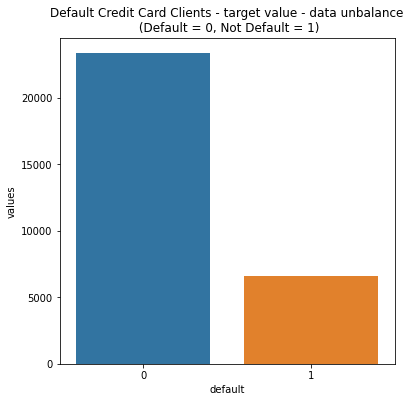

,default,values
0,0,23364
1,1,6636


In [10]:
temp = df["default"].value_counts()

df1 = pd.DataFrame({'default': temp.index,'values': temp.values})

plt.figure(figsize = (6,6))

plt.title('Default Credit Card Clients - target value - data unbalance\n (Default = 0, Not Default = 1)')

sns.set_color_codes("pastel")
sns.barplot(x = 'default', y="values", data=df1)

locs, labels = plt.xticks()

plt.show()
df1

### Distribución Credit Limit 

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


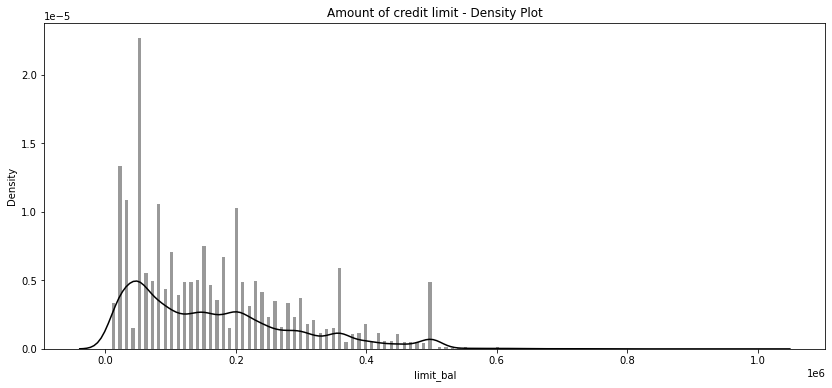

,limit_bal,values
0,50000,3365
1,20000,1976
2,30000,1610
3,80000,1567
4,200000,1528
...,...,...
76,800000,2
77,760000,1
78,690000,1
79,1000000,1


In [11]:
plt.figure(figsize = (14,6))
plt.title('Amount of credit limit - Density Plot')
sns.set_color_codes("dark")
sns.distplot(df['limit_bal'],kde=True,bins=200, color="black")
plt.show()


temp = df["limit_bal"].value_counts()
df1 = pd.DataFrame({'limit_bal': temp.index,'values': temp.values})

df1


## Modelación

###  Importación de Librerias

In [7]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, confusion_matrix, precision_recall_curve, f1_score, r2_score, mean_absolute_error, mean_squared_error
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import classification_report


In [8]:
def MatrixConfusion(cm, labels = ['pay','default']):
    df = pd.DataFrame(data=cm, index=labels , columns=labels)
    df.index.name = 'True'
    df.columns.name = 'Prediction'
    df.loc['Total'] = df.sum()
    df['Total'] = df.sum(axis=1)
    return df

In [9]:
def plot_confusion_matrix(cm, title='Confusion matrix', cmap=plt.cm.Greys):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(cm.shape[1])
    plt.xticks(tick_marks, rotation=0)
    ax = plt.gca()
    ax.set_xticklabels((ax.get_xticks()+1).astype(str))
    plt.yticks(tick_marks)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], '.0f'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    

In [10]:
metrics = pd.DataFrame(index=['accuracy', 'precision', 'recall', 'roc_auc_score'],
                       columns=['BernoulliNB', 'GaussianNB', 'LogisticRegresion', 'kNN', 'DecisionTree', 'AdaBoost', 'RandomForest', 'GradientBoosting', 'RedesNeuronales' , 'SVMs'])

metrics

,BernoulliNB,GaussianNB,LogisticRegresion,kNN,DecisionTree,AdaBoost,RandomForest,GradientBoosting,RedesNeuronales,SVMs
accuracy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
precision,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
recall,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
roc_auc_score,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Conjuntos de entrenamiento y prueba 

In [11]:
target = 'default'

X = df.drop('default', axis = 1)

robust_scaler = RobustScaler()

X = robust_scaler.fit_transform(X)

Y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X,Y,test_size=0.15, random_state=123, stratify=Y)

### BernoulliNB 

Prediction   pay  default  Total
True                            
pay         3115      390   3505
default      552      443    995
Total       3667      833   4500

              precision    recall  f1-score   support

           0     0.8495    0.8887    0.8687      3505
           1     0.5318    0.4452    0.4847       995

    accuracy                         0.7907      4500
   macro avg     0.6906    0.6670    0.6767      4500
weighted avg     0.7792    0.7907    0.7838      4500

--- 0.17249560356140137 seconds ---
[1 0 0 ... 0 0 0]


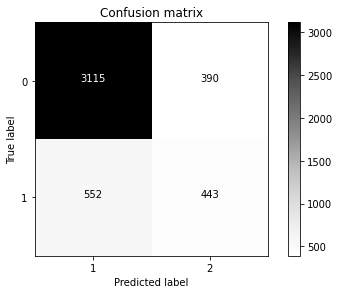

In [28]:
#
# Se importa la libreria
#
from sklearn.naive_bayes import BernoulliNB


start_time = time.time()

#
# Se crea un clasificador Gaussiano ingenuo
#
gnb = BernoulliNB(
    alpha=1.0,        # Laplace parameter
    binarize=0.0,
    fit_prior=True,
    class_prior=None,
)

#
# Se entrena el clasificador
#
gnb.fit(X_train, y_train)

#
# Se pronostica la clasificación de los
# mensajes para los datos de entrada
#
y_pred_test = gnb.predict(X_test)

#
# Evaluación
#
y_test = np.asarray(y_test)
y_pred_test = np.asarray(y_pred_test)

metrics.loc['accuracy','BernoulliNB'] = accuracy_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['precision','BernoulliNB'] = precision_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['recall','BernoulliNB'] = recall_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['roc_auc_score','BernoulliNB'] = roc_auc_score(y_pred_test, y_test)

#
# Matriz Confusión
#

cm = confusion_matrix(y_pred=y_pred_test, y_true=y_test)
pr = MatrixConfusion(cm)
print(pr)
print()
plot_confusion_matrix(cm)

#
# Reporte
#

sk_report = classification_report(
    digits=4,
    y_true=y_test, 
    y_pred=y_pred_test)
print(sk_report)

print("--- %s seconds ---" % (time.time() - start_time))

print(y_pred_test)

Prediction   pay  default  Total
True                            
pay         2918      587   3505
default      442      553    995
Total       3360     1140   4500

              precision    recall  f1-score   support

           0     0.8685    0.8325    0.8501      3505
           1     0.4851    0.5558    0.5180       995

    accuracy                         0.7713      4500
   macro avg     0.6768    0.6942    0.6841      4500
weighted avg     0.7837    0.7713    0.7767      4500

--- 0.12489461898803711 seconds ---
[1 0 0 ... 0 0 0]


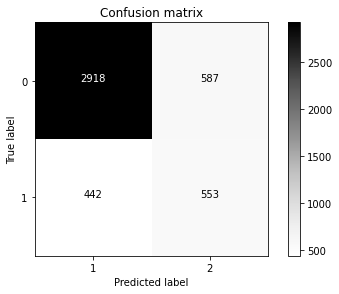

In [29]:
#
# Se importa la libreria
#
from sklearn.naive_bayes import GaussianNB


start_time = time.time()

#
# Se crea un clasificador Gaussiano ingenuo
#
gnb = GaussianNB()

#
# Se entrena el clasificador
#
gnb.fit(X_train, y_train)

#
# Se pronostica la clasificación de los
# mensajes para los datos de entrada
#
y_pred_test = gnb.predict(X_test)

#
# Evaluación
#
y_test = np.asarray(y_test)
y_pred_test = np.asarray(y_pred_test)

metrics.loc['accuracy','GaussianNB'] = accuracy_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['precision','GaussianNB'] = precision_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['recall','GaussianNB'] = recall_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['roc_auc_score','GaussianNB'] = roc_auc_score(y_pred_test, y_test)

#
# Matriz Confusión
#

cm = confusion_matrix(y_pred=y_pred_test, y_true=y_test)
pr = MatrixConfusion(cm)
print(pr)
print()
plot_confusion_matrix(cm)

#
# Reporte
#

sk_report = classification_report(
    digits=4,
    y_true=y_test, 
    y_pred=y_pred_test)
print(sk_report)

print("--- %s seconds ---" % (time.time() - start_time))


print(y_pred_test)

### Regresión Logística

Prediction   pay  default  Total
True                            
pay         3365      140   3505
default      669      326    995
Total       4034      466   4500

              precision    recall  f1-score   support

           0     0.8342    0.9601    0.8927      3505
           1     0.6996    0.3276    0.4463       995

    accuracy                         0.8202      4500
   macro avg     0.7669    0.6438    0.6695      4500
weighted avg     0.8044    0.8202    0.7940      4500

--- 1.7850322723388672 seconds ---
[1 0 0 ... 0 0 0]


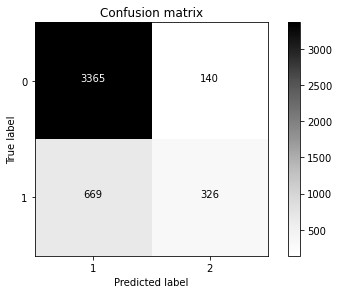

In [30]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss


start_time = time.time()

logisticRegression = LogisticRegression(
    penalty="none",      # ‘l1’, ‘l2’, ‘elasticnet’, ‘none’
    tol=0.0001,          # stop criteria
    C=1.0,               # factor inverso para regularizacion (SVM)
    fit_intercept=True,  #
    class_weight=None,   # None, dict or ‘balanced’
    random_state=15,   #
    solver="lbfgs",      # 'newton-cg’, ‘lbfgs’, ‘liblinear’, ‘sag’, ‘saga’
    max_iter=100,        #
    multi_class="auto",  # ‘ovr’, ‘multinomial’, ‘auto’
    verbose=0,           #
    warm_start=False,    # ?re-usa la solución previa
    l1_ratio=None,       # Elastic-Net mixing parameter, with 0 <= l1_ratio <= 1
    n_jobs=-1,
)

logisticRegression.fit(X_train, y_train)

y_pred_test = logisticRegression.predict(X_test)


#
# Evaluación
#
y_test = np.asarray(y_test)
y_pred_test = np.asarray(y_pred_test)

metrics.loc['accuracy','LogisticRegresion'] = accuracy_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['precision','LogisticRegresion'] = precision_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['recall','LogisticRegresion'] = recall_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['roc_auc_score','LogisticRegresion'] = roc_auc_score(y_pred_test, y_test)

#
# Matriz Confusión
#

cm = confusion_matrix(y_pred=y_pred_test, y_true=y_test)
pr = MatrixConfusion(cm)
print(pr)
print()
plot_confusion_matrix(cm)

#
# Reporte
#

sk_report = classification_report(
    digits=4,
    y_true=y_test, 
    y_pred=y_pred_test)
print(sk_report)

print("--- %s seconds ---" % (time.time() - start_time))


print(y_pred_test)

### kNN

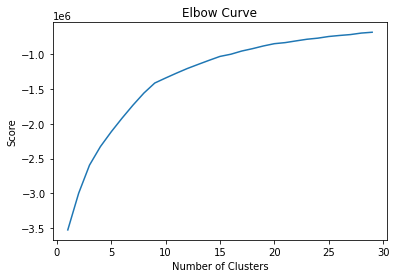

In [15]:
from sklearn.cluster import KMeans
Nc = range(1, 30)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(X_train).score(X_train) for i in range(len(kmeans))]
score
plt.plot(Nc,score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

Prediction   pay  default  Total
True                            
pay         3274      231   3505
default      663      332    995
Total       3937      563   4500

              precision    recall  f1-score   support

           0     0.8316    0.9341    0.8799      3505
           1     0.5897    0.3337    0.4262       995

    accuracy                         0.8013      4500
   macro avg     0.7106    0.6339    0.6530      4500
weighted avg     0.7781    0.8013    0.7796      4500

--- 15.542493343353271 seconds ---
[1 0 0 ... 0 0 0]


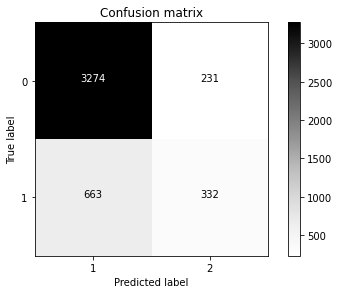

In [31]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=9)
knn.fit(X_train, y_train)

#
# Predicción para el conjunto de prueba
#
y_pred_test = knn.predict(X_test)

#
# Evaluación
#
y_test = np.asarray(y_test)
y_pred_test = np.asarray(y_pred_test)

metrics.loc['accuracy','kNN'] = accuracy_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['precision','kNN'] = precision_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['recall','kNN'] = recall_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['roc_auc_score','kNN'] = roc_auc_score(y_pred_test, y_test)

#
# Matriz Confusión
#

cm = confusion_matrix(y_pred=y_pred_test, y_true=y_test)
pr = MatrixConfusion(cm)
print(pr)
print()
plot_confusion_matrix(cm)

#
# Reporte
#

sk_report = classification_report(
    digits=4,
    y_true=y_test, 
    y_pred=y_pred_test)
print(sk_report)

print("--- %s seconds ---" % (time.time() - start_time))


print(y_pred_test)

DecisionTreeClassifier

/usr/local/lib/python3.7/dist-packages/sklearn/tree/_classes.py:319: FutureWarning: The parameter 'presort' is deprecated and has no effect. It will be removed in v0.24. You can suppress this warning by not passing any value to the 'presort' parameter.
  FutureWarning)


Prediction   pay  default  Total
True                            
pay         3180      325   3505
default      632      363    995
Total       3812      688   4500

              precision    recall  f1-score   support

           0     0.8342    0.9073    0.8692      3505
           1     0.5276    0.3648    0.4314       995

    accuracy                         0.7873      4500
   macro avg     0.6809    0.6360    0.6503      4500
weighted avg     0.7664    0.7873    0.7724      4500

--- 23.57754111289978 seconds ---
[0 0 0 ... 0 0 0]


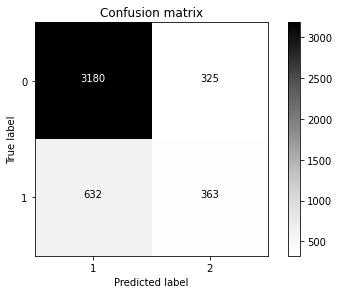

In [32]:
from sklearn.tree import DecisionTreeClassifier

#
# Se construye el arbol
#
decisiontree = DecisionTreeClassifier(
    criterion="gini",
    splitter="best",
    max_depth=None,
    min_samples_split=30,
    min_samples_leaf=10,
    min_weight_fraction_leaf=0.0,
    max_features=None,
    random_state=10,
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    min_impurity_split=None,
    class_weight=None,
    presort=False,
)

#
# Se entrena para los datos de prueba
#
decisiontree.fit(X_train, y_train)

#
# Se pronostica para la muestra de prueba
#
y_pred_test = decisiontree.predict(X_test)

#
# Evaluación
#

y_test = np.asarray(y_test)
y_pred_test = np.asarray(y_pred_test)


metrics.loc['accuracy','DecisionTree'] = accuracy_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['precision','DecisionTree'] = precision_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['recall','DecisionTree'] = recall_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['roc_auc_score','DecisionTree'] = roc_auc_score(y_pred_test, y_test)

#
# Matriz Confusión
#

cm = confusion_matrix(y_pred=y_pred_test, y_true=y_test)
pr = MatrixConfusion(cm)
print(pr)
print()
plot_confusion_matrix(cm)

#
# Reporte
#

sk_report = classification_report(
    digits=4,
    y_true=y_test, 
    y_pred=y_pred_test)
print(sk_report)

print("--- %s seconds ---" % (time.time() - start_time))


print(y_pred_test)

In [ ]:
import pydotplus
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz


def display_tree(clf):

    dot_data = StringIO()
    export_graphviz(
        clf,
        out_file=dot_data,
        filled=True,
        rounded=True,
        special_characters=True,
    )

    return pydotplus.graph_from_dot_data(dot_data.getvalue()).create_png()

In [ ]:
Image(display_tree(decisiontree))

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.651911 to fit



### Ensambles de Modelos

Prediction   pay  default  Total
True                            
pay         3391      114   3505
default      723      272    995
Total       4114      386   4500

              precision    recall  f1-score   support

           0     0.8243    0.9675    0.8901      3505
           1     0.7047    0.2734    0.3939       995

    accuracy                         0.8140      4500
   macro avg     0.7645    0.6204    0.6420      4500
weighted avg     0.7978    0.8140    0.7804      4500

--- 37.58206796646118 seconds ---
[1 0 0 ... 0 0 0]


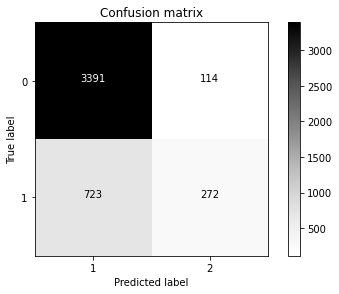

In [33]:
#
# AdaBoostClassifier
#
from sklearn.ensemble import AdaBoostClassifier

AdaBoost = AdaBoostClassifier(n_estimators=10)

#
# Se entrena para los datos de prueba
#
AdaBoost.fit(X_train, y_train)

#
# Se pronostica para la muestra de prueba
#
y_pred_test = AdaBoost.predict(X_test)

#
# Evaluación
#
y_test = np.asarray(y_test)
y_pred_test = np.asarray(y_pred_test)


metrics.loc['accuracy','AdaBoost'] = accuracy_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['precision','AdaBoost'] = precision_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['recall','AdaBoost'] = recall_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['roc_auc_score','AdaBoost'] = roc_auc_score(y_pred_test, y_test)

#
# Matriz Confusión
#

cm = confusion_matrix(y_pred=y_pred_test, y_true=y_test)
pr = MatrixConfusion(cm)
print(pr)
print()
plot_confusion_matrix(cm)

#
# Reporte
#

sk_report = classification_report(
    digits=4,
    y_true=y_test, 
    y_pred=y_pred_test)
print(sk_report)

print("--- %s seconds ---" % (time.time() - start_time))


print(y_pred_test)

Prediction   pay  default  Total
True                            
pay         3309      196   3505
default      666      329    995
Total       3975      525   4500

              precision    recall  f1-score   support

           0     0.8325    0.9441    0.8848      3505
           1     0.6267    0.3307    0.4329       995

    accuracy                         0.8084      4500
   macro avg     0.7296    0.6374    0.6588      4500
weighted avg     0.7870    0.8084    0.7848      4500

--- 48.73599600791931 seconds ---
[1 0 0 ... 0 0 0]


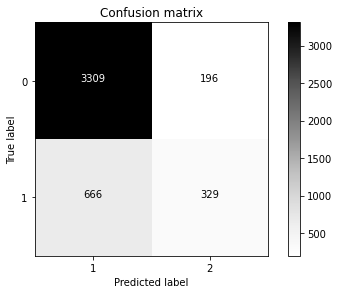

In [34]:
#
# RandomForestClassifier
#
from sklearn.ensemble import RandomForestClassifier

RandomForest = RandomForestClassifier(n_estimators=10)

#
# Se entrena para los datos de prueba
#
RandomForest.fit(X_train, y_train)

#
# Se pronostica para la muestra de prueba
#
y_pred_test = RandomForest.predict(X_test)

#
# Evaluación
#
y_test = np.asarray(y_test)
y_pred_test = np.asarray(y_pred_test)


metrics.loc['accuracy','RandomForest'] = accuracy_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['precision','RandomForest'] = precision_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['recall','RandomForest'] = recall_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['roc_auc_score','RandomForest'] = roc_auc_score(y_pred_test, y_test)

#
# Matriz Confusión
#

cm = confusion_matrix(y_pred=y_pred_test, y_true=y_test)
pr = MatrixConfusion(cm)
print(pr)
print()
plot_confusion_matrix(cm)

#
# Reporte
#

sk_report = classification_report(
    digits=4,
    y_true=y_test, 
    y_pred=y_pred_test)
print(sk_report)

print("--- %s seconds ---" % (time.time() - start_time))

print(y_pred_test)

Prediction   pay  default  Total
True                            
pay         3386      119   3505
default      680      315    995
Total       4066      434   4500

              precision    recall  f1-score   support

           0     0.8328    0.9660    0.8945      3505
           1     0.7258    0.3166    0.4409       995

    accuracy                         0.8224      4500
   macro avg     0.7793    0.6413    0.6677      4500
weighted avg     0.8091    0.8224    0.7942      4500

--- 56.473881483078 seconds ---
[1 0 0 ... 0 0 0]


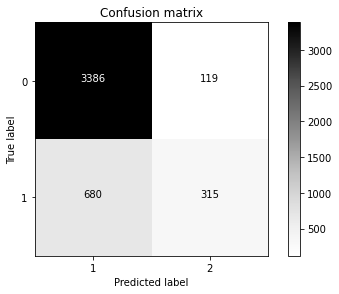

In [35]:
#
# GradientBoostingClassifier
#
from sklearn.ensemble import GradientBoostingClassifier

GradientBoosting = GradientBoostingClassifier(n_estimators=10)

#
# Se entrena para los datos de prueba
#
GradientBoosting.fit(X_train, y_train)

#
# Se pronostica para la muestra de prueba
#
y_pred_test = GradientBoosting.predict(X_test)

#
# Evaluación
#
y_test = np.asarray(y_test)
y_pred_test = np.asarray(y_pred_test)


metrics.loc['accuracy','GradientBoosting'] = accuracy_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['precision','GradientBoosting'] = precision_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['recall','GradientBoosting'] = recall_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['roc_auc_score','GradientBoosting'] = roc_auc_score(y_pred_test, y_test)

#
# Matriz Confusión
#

cm = confusion_matrix(y_pred=y_pred_test, y_true=y_test)
pr = MatrixConfusion(cm)
print(pr)
print()
plot_confusion_matrix(cm)

#
# Reporte
#

sk_report = classification_report(
    digits=4,
    y_true=y_test, 
    y_pred=y_pred_test)
print(sk_report)

print("--- %s seconds ---" % (time.time() - start_time))


print(y_pred_test)

### Redes Neuronales

Prediction   pay  default  Total
True                            
pay         3309      196   3505
default      614      381    995
Total       3923      577   4500

              precision    recall  f1-score   support

           0     0.8435    0.9441    0.8910      3505
           1     0.6603    0.3829    0.4847       995

    accuracy                         0.8200      4500
   macro avg     0.7519    0.6635    0.6878      4500
weighted avg     0.8030    0.8200    0.8011      4500

--- 367.2498118877411 seconds ---
[1 0 0 ... 0 0 0]


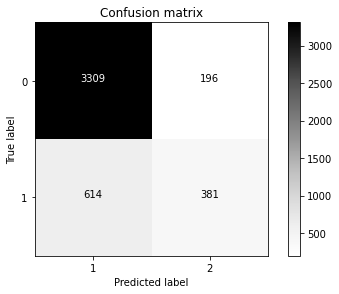

In [39]:
from sklearn.neural_network import MLPClassifier

#
# El parámetro hidden_layer_sizes recibe una tupla que
# indica la cantidad de neuronas de cada capa oculta. En
# el caso presentado, el valor (6,) indica que hay una sola
# capa oculta con 6 neuronas que usan la función sigmoidea.
# El parámetro solver = 'sgd' indica que se usará el
# algoritmo de gradiente descendente estocástico para entrenar
# la red neuronal.
#

RedesNeuronales = MLPClassifier(

    hidden_layer_sizes=(6,),   # Una capa oculta con una neurona
    activation="logistic",     #  {‘identity’, ‘logistic’, ‘tanh’, ‘relu’}
    solver="sgd",              #  {‘lbfgs’, ‘sgd’, ‘adam’}
    alpha=0.0,                 #
    learning_rate_init=0.1,    # Valor de la tasa de aprendizaje
    learning_rate="constant",  # La tasa no se adapta automáticamente
    verbose=False,             # Reporte del proceso de optimización
    shuffle=True,              #
    tol=1e-8,                  #
    max_iter=25000,            # Número máximo de iteraciones
    momentum=0.0,              #
    nesterovs_momentum=False,  #
)

#
# Se entrena para los datos de prueba
#
RedesNeuronales.fit(X_train, y_train)

#
# Se pronostica para la muestra de prueba
#
y_pred_test = RedesNeuronales.predict(X_test)

#
# Evaluación
#
y_test = np.asarray(y_test)
y_pred_test = np.asarray(y_pred_test)


metrics.loc['accuracy','RedesNeuronales'] = accuracy_score(y_true=y_test, y_pred=y_pred_test)
metrics.loc['precision','RedesNeuronales'] = precision_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['recall','RedesNeuronales'] = recall_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['roc_auc_score','RedesNeuronales'] = roc_auc_score(y_pred_test, y_test)

#
# Matriz Confusión
#

cm = confusion_matrix(y_pred=y_pred_test, y_true=y_test)
pr = MatrixConfusion(cm)
print(pr)
print()
plot_confusion_matrix(cm)

#
# Reporte
#

sk_report = classification_report(
    digits=4,
    y_true=y_test, 
    y_pred=y_pred_test)
print(sk_report)

print("--- %s seconds ---" % (time.time() - start_time))

print(y_pred_test)

### SVC

In [ ]:
from sklearn.svm import SVC

start_time = time.time()

svc = SVC(kernel="linear")

svc.fit(X_train, y_train)

#
# Se pronostica para la muestra de prueba
#
y_pred_test = svc.predict(X_test)

#
# Evaluación
#
y_test = np.asarray(y_test)
y_pred_test = np.asarray(y_pred_test)


metrics.loc['accuracy','SVMs'] = accuracy_score(y_true=y_test, y_pred=y_pred_test)
metrics.loc['precision','SVMs'] = precision_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['recall','SVMs'] = recall_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['roc_auc_score','SVMs'] = roc_auc_score(y_pred_test, y_test)

#
# Matriz Confusión
#

cm = confusion_matrix(y_pred=y_pred_test, y_true=y_test)
pr = MatrixConfusion(cm)
print(pr)
print()
plot_confusion_matrix(cm)

#
# Reporte
#

sk_report = classification_report(
    digits=4,
    y_true=y_test, 
    y_pred=y_pred_test)
print(sk_report)

print("--- %s seconds ---" % (time.time() - start_time))

print(y_pred_test)


In [40]:
100*metrics

,BernoulliNB,GaussianNB,LogisticRegresion,kNN,DecisionTree,AdaBoost,RandomForest,GradientBoosting,RedesNeuronales,SVMs
accuracy,79.0667,77.1333,82.0222,80.1333,78.7333,81.4,80.8444,82.2444,82,NaN
precision,53.1813,48.5088,69.9571,58.9698,52.7616,70.4663,62.6667,72.5806,66.0312,NaN
recall,44.5226,55.5779,32.7638,33.3668,36.4824,27.3367,33.0653,31.6583,38.2915,NaN
roc_auc_score,69.064,67.677,76.6865,71.0648,68.0912,76.4461,72.956,77.9283,75.19,NaN


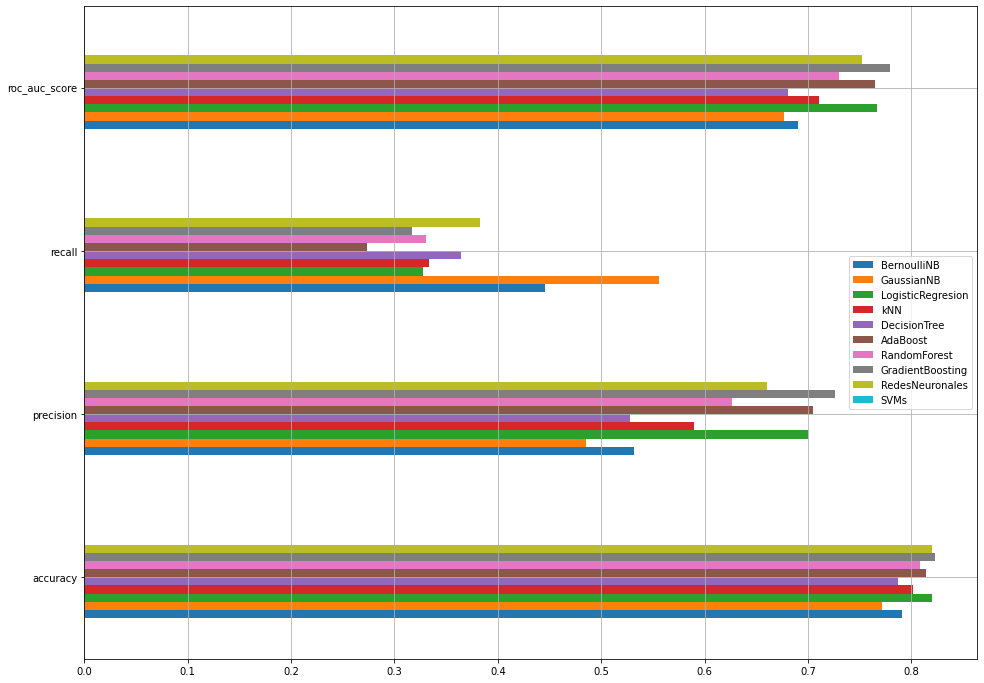

In [41]:
fig, ax = plt.subplots(figsize = (16, 12))
metrics.plot(kind='barh', ax=ax)
ax.grid();